## Notebook de trabajo, ya procesado el csv de origen.
En el anterior notebook se trabajó de 0 el csv de origen proporcionado por Pelayo Arbués, head de data science de idealista.

En este notebook, se trabajará a partir del notebook ya procesado con KNN, encodeado y limpio.

In [1]:
# Importamos las librerías
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder
from utils.milibreria import * 
import re
import plotly.express as px
# mapas interactivos
import folium
from folium.plugins import FastMarkerCluster
import geopandas as gpd
from branca.colormap import LinearColormap

In [2]:
ventas_valencia = pd.read_csv("data/ventas_valencia_procesado.csv")
ventas_valencia.drop('Unnamed: 0', axis =1, inplace=True)
ventas_valencia.drop('Periodo', axis =1, inplace=True)
ventas_valencia

,ID,Precio,Preciom2,Metros_Construidos,Habitaciones,Baños,Terraza,Ascensor,Aire_Acondicionado,Servicios,...,Calidad_suelo,Año_diseñado,Plantas_máximas,Número_viviendas,Calidad_catastral,Distancia_centro,Distancia_metro,Distancia_Blasco,Latitud,Longitud
0,A9651535568269959084,111000.0,1480.00,75,2,1,1,1,1,2,...,6,2001,7,35,6,3.759093,0.756517,3.373132,39.500908,-0.393538
1,A13801394133398327300,169000.0,1320.31,128,4,2,0,1,1,3,...,3,1976,7,56,5,2.073773,0.370680,0.540594,39.482599,-0.359125
2,A8013965313053471366,162000.0,1883.72,86,2,1,0,1,1,3,...,4,2010,6,20,4,2.099641,0.038560,0.719203,39.485144,-0.362470
3,A15308599866706500727,199000.0,1792.79,111,4,2,0,1,0,3,...,4,1977,8,25,5,2.120917,0.524827,0.915379,39.487445,-0.367417
4,A7882254711596398998,73000.0,1303.57,56,3,1,1,1,0,3,...,4,1960,6,20,8,3.087950,1.129985,2.009535,39.497057,-0.370182
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33617,A11108975532973114427,121000.0,1008.33,120,3,2,0,1,1,3,...,2,1982,4,13,5,2.800362,0.710564,2.607601,39.492210,-0.391340
33618,A10601844591112299482,136000.0,1619.05,84,2,1,1,1,1,3,...,4,1970,6,49,7,2.282765,0.321158,2.404973,39.486174,-0.392554
33619,A4404727404893818740,98000.0,867.26,113,2,2,1,0,0,3,...,2,1974,6,17,7,2.583955,0.661318,2.510628,39.489754,-0.391909
33620,A14663195131112920418,45000.0,661.76,68,3,1,0,0,0,3,...,1,1963,6,41,7,3.420772,0.529830,3.305286,39.495606,-0.398167


### Análisis exploratorio de datos
A falta de extraer los barrios, comenzamos con el análisis exploratorio de datos con el objetivo de descubrir patrones, tendencias y relaciones.

In [3]:
# Mostramos la información básica de nuestro dataframe
ventas_valencia.describe()

,Precio,Preciom2,Metros_Construidos,Habitaciones,Baños,Terraza,Ascensor,Aire_Acondicionado,Servicios,Garaje,...,Calidad_suelo,Año_diseñado,Plantas_máximas,Número_viviendas,Calidad_catastral,Distancia_centro,Distancia_metro,Distancia_Blasco,Latitud,Longitud
count,3.362200e+04,33622.000000,33622.000000,33622.000000,33622.000000,33622.000000,33622.000000,33622.000000,33622.000000,33622.000000,...,33622.000000,33622.000000,33622.000000,33622.000000,33622.000000,33622.000000,33622.000000,33622.000000,33622.000000,33622.000000
mean,1.996783e+05,1714.535686,108.945780,3.065761,1.585688,0.254714,0.790732,0.471447,2.779847,0.168580,...,3.421034,1970.552466,7.042502,36.830647,5.337577,2.092694,0.644774,2.065233,39.471631,-0.375288
std,1.771560e+05,850.807252,47.285144,1.085742,0.642585,0.435707,0.406792,0.499191,0.534646,0.374386,...,2.440414,24.052279,2.889755,45.107082,1.580593,0.969574,0.419772,1.085123,0.014052,0.019529
min,2.000000e+04,480.690000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,-1.000000,1591.000000,0.000000,1.000000,0.000000,0.003053,0.003744,0.001828,39.438269,-0.420701
25%,9.900000e+04,1112.500000,80.000000,3.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.000000,...,1.000000,1961.000000,5.000000,12.000000,4.000000,1.363046,0.329513,1.218373,39.461678,-0.389691
50%,1.510000e+05,1531.250000,100.000000,3.000000,2.000000,0.000000,1.000000,0.000000,3.000000,0.000000,...,3.000000,1970.000000,7.000000,22.000000,5.000000,2.124726,0.538083,2.006919,39.469803,-0.377498
75%,2.340000e+05,2114.290000,123.000000,4.000000,2.000000,1.000000,1.000000,1.000000,3.000000,0.000000,...,5.000000,1983.000000,8.000000,43.000000,7.000000,2.765479,0.874896,2.840189,39.483848,-0.365326
max,2.772000e+06,9421.820000,912.000000,81.000000,12.000000,1.000000,1.000000,1.000000,3.000000,1.000000,...,11.000000,2018.000000,33.000000,556.000000,9.000000,5.666819,2.859185,5.019537,39.503675,-0.320134


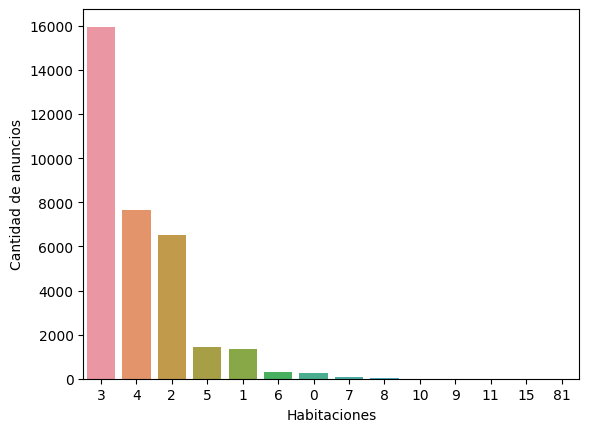

In [4]:
# Vemos los valores que tenemos en la columna habitaciones por ejemplo.
sns.countplot(x="Habitaciones", data=ventas_valencia, order=ventas_valencia['Habitaciones'].value_counts().index)
plt.ylabel('Cantidad de anuncios')
plt.show()

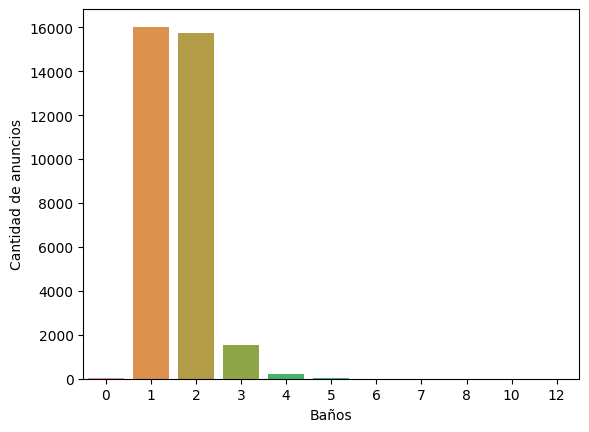

In [5]:
# Vemos los valores que tenemos en la columna baños, que también nos interesa.
sns.countplot(x="Baños", data=ventas_valencia)
plt.ylabel('Cantidad de anuncios')
plt.show()

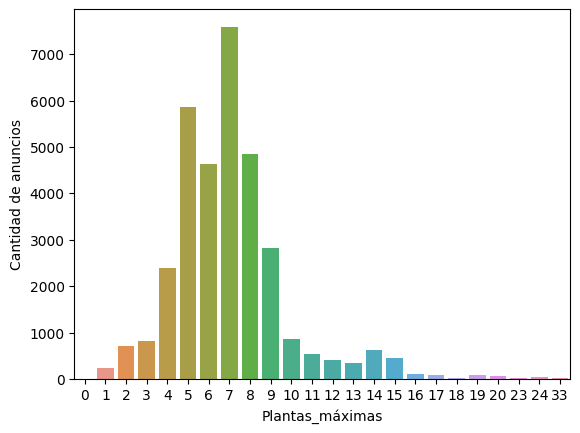

In [6]:
# Vemos los valores que tenemos en la columna de plantas máximas para hacernos una idea de la altura de los edificios.
sns.countplot(x="Plantas_máximas", data=ventas_valencia)
plt.ylabel('Cantidad de anuncios')
plt.show()

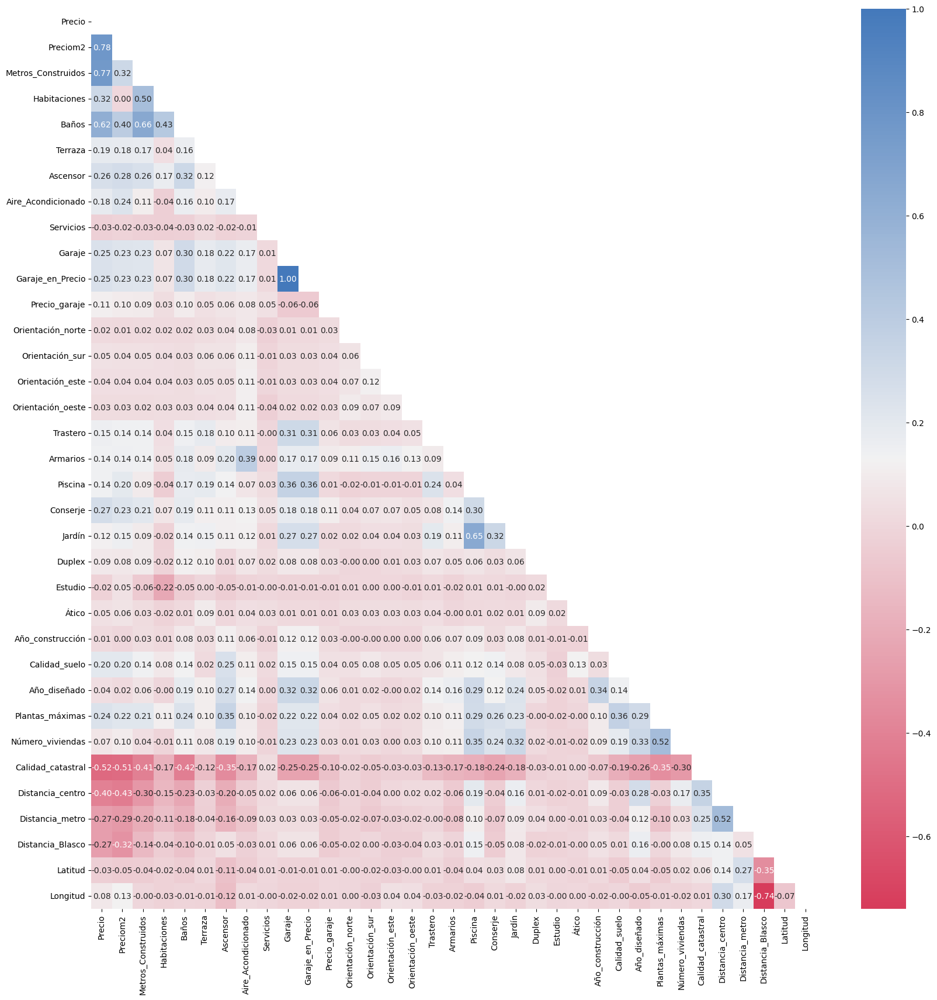

In [7]:
# Vamos a ver la correlación entre las diferentes variables que tenemos.

# Generamos una copia sin la columna ID que es tipo objeto.
ventas_valencia_copy = ventas_valencia.drop(columns="ID")

# Generamos el heatmap para ver las correlaciones.
ventas_valencia_copy.corr()
cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)

mask = np.zeros_like(ventas_valencia_copy.corr(), dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(20,20))
sns.heatmap(ventas_valencia_copy.corr(), cmap=cmap, annot=True, fmt='.2f', mask=mask)

plt.show()

Podemos observar que las variables que más correlación tienen con nuestro target(Precio) son metros_construidos, baños, Calidad_catastral y lógicamente Preciom2.

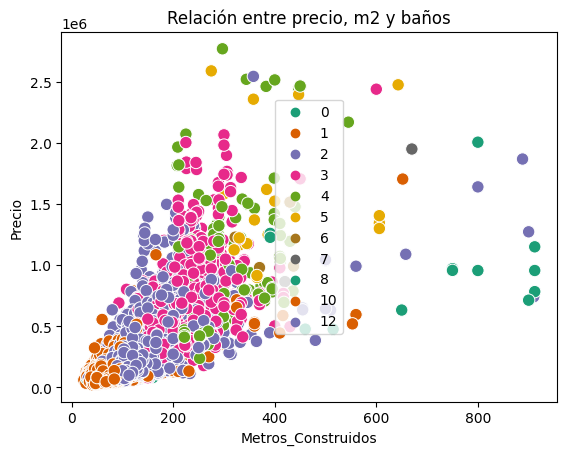

In [8]:
sns.scatterplot(x="Metros_Construidos", y="Precio", hue="Baños", data=ventas_valencia_copy, palette="Dark2", s=80)
plt.title("Relación entre precio, m2 y baños")
plt.legend(loc="center")
plt.show()

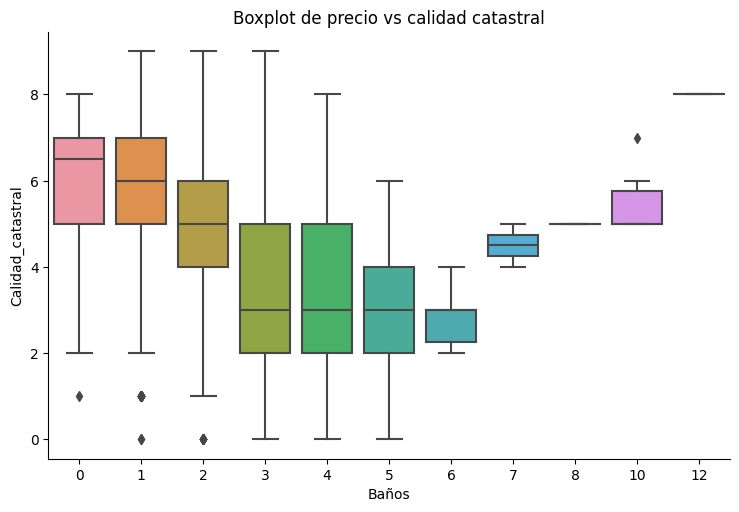

In [9]:
# Nos hacemos un catplot con la relación entre baños y calidad catastral.
sns.catplot(x="Baños", y="Calidad_catastral", data=ventas_valencia_copy, kind="box", aspect=1.5)
plt.title("Boxplot de precio vs calidad catastral")
plt.show()

In [10]:
latitudes = ventas_valencia['Latitud'].tolist()
longitudes = ventas_valencia['Longitud'].tolist()
localizaciones = list(zip(latitudes, longitudes))   # Se mete las latitudes en una tupla

map1 = folium.Map(location=[39.47296700726913, -0.37651172896217977], zoom_start=13) # Ponemos en location donde queremos que enfoque el mapa al principio.
FastMarkerCluster(data=localizaciones).add_to(map1)
map1

### Plotly express

Scatters

In [11]:
# importar plotly express
import plotly.express as px

# Gráfico de dispersión de Precio vs. Metros construidos
fig1 = px.scatter(ventas_valencia, x="Metros_Construidos", y="Precio")
fig1.show()

# Gráfico de dispersión de Precio vs. Calidad del suelo
fig2 = px.scatter(ventas_valencia, x="Calidad_suelo", y="Precio")
fig2.show()

# Gráfico de dispersión de Precio vs. Distancia al centro
fig3 = px.scatter(ventas_valencia, x="Distancia_centro", y="Precio")
fig3.show()

# Gráfico de dispersión de Precio vs. Distancia al metro
fig4 = px.scatter(ventas_valencia, x="Distancia_metro", y="Precio")
fig4.show()


In [12]:
# Gráfico de barras de Precio vs. Número de viviendas
fig1 = px.bar(ventas_valencia, x="Número_viviendas", y="Precio")
fig1.show()

# Gráfico de líneas de Precio vs. Año diseñado
fig2 = px.line(ventas_valencia, x="Año_diseñado", y="Precio")
fig2.show()

# Gráfico de cajas de Precio vs. Calidad Catastral
fig3 = px.box(ventas_valencia, x="Calidad_catastral", y="Precio")
fig3.show()

### Desencodeando el dataframe
Como voy a empezar a mostrar gráficas me interesa de momento desencodear el dataframe para que se muestre como valores legibles en las gráficas.

In [3]:
# Generamos una copia para mantener nuestro dataframe encodeado.
desencodeado_valencia = ventas_valencia.copy()

In [4]:
# Generamos una función para cambiar los 0 y 1 de aquellas columnas binarias.
def cambiar_ceros_y_unos(df):
    """
    Función para cambiar los valores 0 y 1 por 'No' y 'Si' en un dataframe
    """
    
    # obtener las columnas del dataframe
    columnas = df.columns
    
    # recorrer cada columna
    for columna in columnas:
        # verificar si la columna tiene solo 0 y 1
        valores_columna = df[columna].unique()
        if set(valores_columna) == set([0,1]):
            # cambiar los valores 
            df[columna] = df[columna].map({0: 'No', 1: 'Si'})
            
    # regresar el dataframe
    return df
    
# aplicar la función al dataframe
desencodeado_valencia = cambiar_ceros_y_unos(desencodeado_valencia)

In [5]:
# Con las orientaciones voy a crear una columna única llamada orientación.
desencodeado_valencia['Orientación'] = np.where(desencodeado_valencia['Orientación_norte'] == 'Si', 'Norte',
                             np.where(desencodeado_valencia['Orientación_sur'] == 'Si', 'Sur',
                                      np.where(desencodeado_valencia['Orientación_este'] == 'Si', 'Este',
                                               np.where(desencodeado_valencia['Orientación_oeste'] == 'Si', 'Oeste', 'Desconocida'))))

# Elimino las columnas de orientación.
desencodeado_valencia.drop(['Orientación_norte', 'Orientación_sur', 'Orientación_este', 'Orientación_oeste'], axis=1, inplace=True)


In [6]:
desencodeado_valencia.to_csv("desencodeado.csv")

### Preguntas a resolver

#### 1- ¿Qué orientación tienen el mayor número de pisos a la venta?

In [16]:
# Importamos plotly express.
import plotly.express as px

# Agrupar datos por Orientación
orientaciones = desencodeado_valencia[desencodeado_valencia['Orientación'] != 'Desconocida'].groupby('Orientación')['Orientación'].count().sort_values(ascending=False).reset_index(name='Cantidad')

# Gráfico de barras de Orientación vs. Cantidad
fig = px.bar(orientaciones, x="Orientación", y="Cantidad", color="Orientación",
             color_discrete_map = {
                 'Orientación_norte': '#4285F4',
                 'Orientación_sur': '#0F9D58',
                 'Orientación_este': '#DB4437',
                 'Orientación_oeste': '#F4B400'
             })
fig.show()

A simple vista, la mejor orientación para un hogar es aquella que recibe la mayor intensidad de luz natural durante más horas. La mejor vivienda es la que aprovecha al máximo la trayectoria del sol para crear el mejor ambiente interior sin necesidad de consumir demasiada energía artificial. Hay estudios que calculan que una correcta orientación puede ayudarte a reducir hasta en un 70% el consumo energético.

La orientación es un tema muy personal, en muchas ocasiones y de manera general en nuestro país se apuesta por la orientación sur, ya que se considera la más apropiada para ahorrar energía. Pero, intentado ahondar más en este asunto, vamos a ver las ventajas e inconvenientes de cada una de las orientaciones:

* <b>Orientación sur</b>: Como decíamos, en nuestro país se apuesta por esta orientación, ya que se considera la más apropiada para ahorrar energía. Esto es una gran ventaja para viviendas ubicadas en lugares fríos, sin embargo, en las zonas más cálidas será necesaria la instalación de toldos para evitar la sobreexposición. 

* <b>Orientación este</b>: En esta orientación tendremos luz y sol desde el amanecer hasta el mediodía. Es la alternativa a la orientación sur en zonas muy calurosas. El calor se acumula hasta el mediodía y se libera durante la tarde-noche, por lo cual genera un consumo equilibrado de aire acondicionado y calefacción.

* <b>Orientación oeste</b>: El sol incide en la vivienda durante todo el año del mediodía hasta al atardecer. En invierno la casa recibe pocas horas de luz natural pero son las que el sol irradia más calor. En verano, recibe el sol en las horas de más calor, lo que supone un coste energético en aire acondicionado.

* <b>Orientación norte</b>: El sol no incide de forma directa, de manera que sólo recibe algo de radiación solar a primera y última hora durante los meses de verano. El gasto en calefacción durante el invierno es el más acentuado en la orientación norte.

<b>Conclusión</b>: Como se puede ver los pisos orientados al Oeste tienen una presencia mucho menor en los pisos anunciados a la venta en Idealista. Hay que tener en cuenta factores como que la orientación al oeste en la ciudad de Valencia implica en dirección opuesta al mar. Al ser una ciudad húmedad y con una temperatura media anual de 17,6 grados las viviendas con orientación oeste tienen una mayor temperatura, por lo tanto, mayor gasto en aire acondicionado o elementos para cubrir el sol.


#### 2- ¿Qué correlación hay entre el precio de venta y la orientación?

In [17]:
# importar plotly express
import plotly.express as px

# filtrar los datos para eliminar 'Desconocido'
filtro_df = desencodeado_valencia[desencodeado_valencia['Orientación'] != 'Desconocida']

# Gráfico de dispersión de Orientación vs. Precio
fig = px.scatter(filtro_df, x='Orientación', y='Precio', color='Orientación',
             color_discrete_map = {
                 'Orientación_norte': '#4285F4',
                 'Orientación_sur': '#0F9D58',
                 'Orientación_este': '#DB4437',
                 'Orientación_oeste': '#F4B400'
             })
fig.show()

Vamos a ver cual es el precio medio de los pisos en cada orientación para ver si existe una correlación clara.

In [18]:
# Sacamos los precios medios para cada orientación.
print('El precio medio para los pisos con orientación sur es de {} euros.'.format(desencodeado_valencia[desencodeado_valencia['Orientación'] == 'Sur']['Precio'].mean().astype(int)))
print('El precio medio para los pisos con orientación norte es de {} euros.'.format(desencodeado_valencia[desencodeado_valencia['Orientación'] == 'Norte']['Precio'].mean().astype(int)))
print('El precio medio para los pisos con orientación este es de {} euros.'.format(desencodeado_valencia[desencodeado_valencia['Orientación'] == 'Este']['Precio'].mean().astype(int)))
print('El precio medio para los pisos con orientación oeste es de {} euros.'.format(desencodeado_valencia[desencodeado_valencia['Orientación'] == 'Oeste']['Precio'].mean().astype(int)))

El precio medio para los pisos con orientación sur es de 216026 euros.
El precio medio para los pisos con orientación norte es de 206801 euros.
El precio medio para los pisos con orientación este es de 192539 euros.
El precio medio para los pisos con orientación oeste es de 178676 euros.


Observamos que los pisos con orientación oeste que por un lado veíamos que son los menos anunciados en la plataforma, también son los más baratos de la ciudad. Por otro lado, los pisos con orientación sur que son típicamente en España los mejor valorados, también son los que tienen un precio de venta más alto. 

Una encuesta de una empresa promotora ha revelado que en Valencia uno de cada dos compradores de una vivienda prefiere la orientación norte, al parecer para lograr más frescor en verano. 

Curiosamente, y esto es válido para gran parte del litoral mediterráneo, las fachadas con orientación norte no son las más aconsejables. Si bien es cierto que tienen menos horas de sol, las corrientes de aire son escasas, porque la norte es una de las direcciones menos habituales del viento durante los meses más calurosos, donde domina los vientos del este (levante). 

Esto se traduce en que a pesar de una mayor proporción de sombra, en las viviendas orientadas al norte el bochorno es mayor que en las orientadas al este. Y a pesar de que la orientación a poniente pueda ser muy cálida por las tardes, los pisos de este tipo que además tienen fachada a levante suelen ser los que disfrutan de mayores corrientes nocturnas, lo cual es un privilegio.

#### 3- ¿Qué porcentaje de vivientas a la venta tienen garaje? ¿Cuántas lo tienen incluido en el precio?

In [19]:
# Agrupamos los datos.
garajes = desencodeado_valencia.groupby('Garaje')['Garaje'].count().reset_index(name='Cantidad')

# Gráficamos.
fig = px.bar(garajes, x="Garaje", y="Cantidad", color="Garaje",
             color_discrete_map = {
                 'Si': 'blue',
                 'No': '#FF0000'
             })
fig.show()

In [20]:
# Agrupamos.
garajes = desencodeado_valencia.groupby('Garaje')['Garaje'].count()
total = desencodeado_valencia['Garaje'].count()

# Calcular el porcentaje
porcentajes_garaje = garajes.apply(lambda x: (x/total)*100).reset_index(name='Porcentaje')

# Mostramos.
print('El porcentaje de pisos a la venta en la ciudad de Valencia sin garaje es de {}%.'.format(round(porcentajes_garaje[porcentajes_garaje['Garaje'] == 'No']['Porcentaje'].values[0],2)))
print('El porcentaje de pisos a la venta en la ciudad de Valencia con garaje es de {}%.'.format(round(porcentajes_garaje[porcentajes_garaje['Garaje'] == 'Si']['Porcentaje'].values[0],2)))


El porcentaje de pisos a la venta en la ciudad de Valencia sin garaje es de 83.14%.
El porcentaje de pisos a la venta en la ciudad de Valencia con garaje es de 16.86%.


In [21]:
# Calcular el valor medio de la columna 'Precio_garaje'
precio_garaje_medio = desencodeado_valencia[desencodeado_valencia['Precio_garaje'] > 1000]['Precio_garaje'].mean()

# Imprimir el valor medio
print('El precio medio para de las plazas de garaje en Valencia es de {} €'.format(precio_garaje_medio.astype(int)))

El precio medio para de las plazas de garaje en Valencia es de 24631 €


Podemos observar que la gran mayoría de inmuebles anunciados no tienen garaje. Por lo tanto, de cara a comprar una vivienda hay que tener en cuenta que la mayoría de pisos anunciados no tendrán garaje en el anuncio y si queremos comprar uno el precio medio de acuerdo a nuestros datos es de 24.631 €.

#### 4- ¿Cuál es el precio medio del m2 en Valencia?

In [22]:
# Calcular el valor medio de la columna 'Precio_garaje'
precio_m2_medio = desencodeado_valencia['Preciom2'].mean()

# Imprimir el valor medio
print('El precio medio del metro cuadrado en Valencia es de {} €'.format(precio_m2_medio.astype(int)))

El precio medio del metro cuadrado en Valencia es de 1714 €


#### 5- ¿Qué porcentaje de viviendas tienen aire acondicionado?

In [29]:
# Agrupamos los datos.
garajes = desencodeado_valencia.groupby('Aire_Acondicionado')['Aire_Acondicionado'].count().reset_index(name='Cantidad')

# Gráficamos.
fig = px.bar(garajes, x="Aire_Acondicionado", y="Cantidad", color="Aire_Acondicionado",
             color_discrete_map = {
                 'Si': 'blue',
                 'No': '#FF0000'
             })
fig.show()

In [31]:
# Agrupamos.
aires = desencodeado_valencia.groupby('Aire_Acondicionado')['Aire_Acondicionado'].count()
total = desencodeado_valencia['Aire_Acondicionado'].count()

# Calcular el porcentaje
porcentajes_aire = aires.apply(lambda x: (x/total)*100).reset_index(name='Porcentaje')

# Mostramos.
print('El porcentaje de pisos a la venta en la ciudad de Valencia sin aire acondicionado es de {}%.'.format(round(porcentajes_aire[porcentajes_aire['Aire_Acondicionado'] == 'No']['Porcentaje'].values[0],2)))
print('El porcentaje de pisos a la venta en la ciudad de Valencia con aire acondicionado es de {}%.'.format(round(porcentajes_aire[porcentajes_aire['Aire_Acondicionado'] == 'Si']['Porcentaje'].values[0],2)))


El porcentaje de pisos a la venta en la ciudad de Valencia sin aire acondicionado es de 52.86%.
El porcentaje de pisos a la venta en la ciudad de Valencia con aire acondicionado es de 47.14%.


In [38]:
fig = px.scatter(desencodeado_valencia, x = 'Aire_Acondicionado', y = 'Precio',color='Aire_Acondicionado', title = 'Relación entre precio y Aire acondicionado')
fig.show()

Podemos observar a partir de 1.5 M de precio de venta en las viviendas  si tienen la gran mayoría aire acondicionado, sin embargo, no podemos determinar que sea uno de los factores clave ya que encontramos viviendas que no tienen y muestran un precio de venta similar.

#### 6- ¿Cuántas viviendas tienen conserje?

In [32]:
# Agrupamos los datos.
conserje = desencodeado_valencia.groupby('Conserje')['Conserje'].count().reset_index(name='Cantidad')

# Gráficamos.
fig = px.bar(conserje, x="Conserje", y="Cantidad", color="Conserje",
             color_discrete_map = {
                 'Si': 'blue',
                 'No': '#FF0000'
             })
fig.show()

In [35]:
# Agrupamos.
conserjes = desencodeado_valencia.groupby('Conserje')['Conserje'].count()
total = desencodeado_valencia['Conserje'].count()

# Calcular el porcentaje
porcentajes_conserje = conserjes.apply(lambda x: (x/total)*100).reset_index(name='Porcentaje')

# Mostramos.
print('El porcentaje de pisos a la venta en la ciudad de Valencia sin conserje en el edificio es de {}%.'.format(round(porcentajes_conserje[porcentajes_conserje['Conserje'] == 'No']['Porcentaje'].values[0],2)))
print('El porcentaje de pisos a la venta en la ciudad de Valencia con conserje en el edificio es de {}%.'.format(round(porcentajes_conserje[porcentajes_conserje['Conserje'] == 'Si']['Porcentaje'].values[0],2)))


El porcentaje de pisos a la venta en la ciudad de Valencia sin conserje en el edificio es de 94.77%.
El porcentaje de pisos a la venta en la ciudad de Valencia con conserje en el edificio es de 5.23%.


Vamos a ver cómo influye en el precio de la vivienda tener conserje o no en el edificio.

In [37]:
fig = px.scatter(desencodeado_valencia, x = 'Conserje', y = 'Precio',color='Conserje', title = 'Relación entre precio y conserje')
fig.show()

Como podemos observar no existe una correlación directa entre el precio y que el edificio tenga conserje o no. Tal vez socialmente se percibe como algo positivo pero no tiene un efecto tan claro a la hora de determinar el precio, hay otros factores que influyen más en el precio de la vivienda para la ciudad de Valencia.

#### 7- ¿Cuáles son los años donde más viviendas se construyeron?

In [70]:
fig = px.histogram(desencodeado_valencia[(desencodeado_valencia['Año_construcción']>1899) & (desencodeado_valencia['Año_construcción']<2019)], x = 'Año_construcción', title = 'Número de registros por año desde 1900 hasta 2018')
fig.show()

In [71]:
# imprimir el resultado
print('El número de viviendas construidas antes de 1900 fue de {} viviendas'.format(desencodeado_valencia[(desencodeado_valencia['Año_construcción'] < 1900)].shape[0]))
print('El número de viviendas construidas entre 1900-1940 fue de {} viviendas'.format(desencodeado_valencia[(desencodeado_valencia['Año_construcción'] >= 1900) & (desencodeado_valencia['Año_construcción'] <= 1940)].shape[0]))
print('El número de viviendas construidas entre 1941-1960 fue de {} viviendas'.format(desencodeado_valencia[(desencodeado_valencia['Año_construcción'] >= 1941) & (desencodeado_valencia['Año_construcción'] <= 1960)].shape[0]))
print('El número de viviendas construidas entre 1961-1980 fue de {} viviendas'.format(desencodeado_valencia[(desencodeado_valencia['Año_construcción'] >= 1961) & (desencodeado_valencia['Año_construcción'] <= 1980)].shape[0]))
print('El número de viviendas construidas entre 1981-2000 fue de {} viviendas'.format(desencodeado_valencia[(desencodeado_valencia['Año_construcción'] >= 1981) & (desencodeado_valencia['Año_construcción'] <= 2000)].shape[0]))
print('El número de viviendas construidas entre 2001-2018 fue de {} viviendas'.format(desencodeado_valencia[(desencodeado_valencia['Año_construcción'] >= 2001) & (desencodeado_valencia['Año_construcción'] <= 2018)].shape[0]))

El número de viviendas construidas antes de 1900 fue de 312 viviendas
El número de viviendas construidas entre 1900-1940 fue de 1562 viviendas
El número de viviendas construidas entre 1941-1960 fue de 4092 viviendas
El número de viviendas construidas entre 1961-1980 fue de 19857 viviendas
El número de viviendas construidas entre 1981-2000 fue de 5104 viviendas
El número de viviendas construidas entre 2001-2018 fue de 2673 viviendas


¿Qué nos indica esto?

Nos indica que es una ciudad envejecida en cuanto a la antigüedad de los edificios y es que entorno al 47% de las viviendas en la ciudad de Valencia fueron construidas entre los años 1961-1980. Esto es importante tenerlo en cuenta puesto que aquellas de mayor antigüedad que no han tenido una reforma integral, necesitarán de arreglos que pueden aumentar el coste de nuestra vivienda.

Adicionalmente y como factor a tener en cuenta de cara a adquirir una vivienda en Valencia, las Inspecciones Técnicas de los Edificios (ITE), tienen como obligatoriedad pasarse a los 50 años de su construcción. A partir de los 50 años se deberá pasar cada 10 años. 

#### 8- ¿Cómo influye la distancia al centro en el precio?
Vimos en nuestro diagrama de correlaciones que tiene una correlación inversa del 0.40. Por lo tanto, como suele ser habitua cuanto más alejadas del centro de Valencia menor precio tendrán.

In [73]:
fig = px.scatter(desencodeado_valencia, x = 'Distancia_centro', y = 'Precio', title = 'Relación entre distancia al centro y precio')
fig.show()

9- ¿Cómo influye la distancia a la playa en el precio?

10- ¿Cómo influye el número de servicios que tenga la comunidad en el precio?

```python

# Iterar sobre todas las filas del DataFrame




for i in gdf.index:

    Long = str(float(gdf.loc[i, 'Longitud']))

    Lat = str(float(gdf.loc[i, 'Latitud']))

````

### Determinación barrios usando open data de airbnb.

Debido a la imposibilidad de usar una API para reducir los costes del proyecto. Intenté buscar diferentes maneras de poder extraer los barrios al que pertenecían los pisos anunciados en nuestro dataset.

Finalmente, esta es la solución que he usado, tomando como referencia el listado de airbnbs publicados en http://insideairbnb.com.

<html>
<head>
    <title>Cálculo de distancias entre puntos</title>
</head>
<body>
    <p>
        From math import acos, sin, cos 
    </p>
    <p>
        # Primero, creamos una función que calcule la distancia entre dos puntos.
    </p>
    <p>
        <pre>
            def calculateDistance(lat1, lon1, lat2, lon2):
        </pre>
    </p>
    <p>
        # La fórmula para calcular la distancia entre dos puntos en una esfera usando latitud y longitud es:
    </p>
    <p>
        <pre>
            # d = acos(sin(lat1) * sin(lat2) +
            # cos(lat1) * cos(lat2) *
            # cos(lon1 - lon2)) * R
        </pre>
    </p>
    <p>
        # d: distancia entre los puntos.
    </p>
    <p>
        # R: radio de la esfera (radio de la tierra = 6371 km).
    </p>
    <p>
        # lat1, lon1: latitud y longitud del primer punto.
    </p>
    <p>
        # lat2, lon2: latitud y longitud del segundo punto.
    </p>
    <p>
        <pre>
            R = 6371 # Radio de la tierra en km.
            d = acos(sin(lat1) * sin(lat2) + cos(lat1) * cos(lat2) * cos(lon1 - lon2)) * R
            return d
        </pre>
    </p>
    <p>
        # Usamos un bucle para recorrer cada fila de 'ventas_valencia' y calcular la distancia entre los puntos.
    </p>
    <p>
        # Para cada punto, guardamos la distancia minima y el valor de 'neighbourhood', el barrio que le corresponde.
    </p>
    <p>
        <pre>
            neighbourhood = []
            for i in range(len(ventas_valencia)):
                lat1 = ventas_valencia['Latitud'][i]
                lon1 = ventas_valencia['Longitud'][i]
                min_dist = float('inf') # Distancia minima inicializada a infinito*(ver explicación abajo).
                min_neighbourhood = '' # Nombre del barrio inicializado a vacio*(ver explicación abajo).
        </pre>
    </p>
    <p>
        # Recorremos 'listado' y calculamos la distancia entre los puntos
    </p>
    <p>
        <pre>
            for j in range(len(listado)):
                lat2 = listado['latitude'][j]
                lon2 = listado['longitude'][j]
                dist = calculateDistance(lat1, lon1, lat2, lon2)
        </pre>
    </p>
    <p>
        # Guardamos el nombre del barrio cuando la distancia sea menor que la distancia minima.
    </p>
    <p>
        <pre>
            if dist < min_dist:
                min_dist = dist
                min_neighbourhood = listado['neighbourhood'][j]
        </pre>
    </p>
    <p>
        # Guardamos el nombre del barrio en la lista 'neighbourhood'.
    </p>
    <p>
        <pre>
            neighbourhood.append(min_neighbourhood)
        </pre>
    </p>
    <p>
        # Agregamos la lista 'neighbourhood' al dataframe 'ventas_valencia'.
    </p>
    <p>
        <pre>
            ventas_valencia['neighbourhood'] = neighbourhood
        </pre>
    </p>
    <p>
        """La distancia mínima inicializada al infinito significa que la distancia inicial entre los dos puntos se define como infinita. Esto significa que, al comenzar el bucle, se supone que la distancia entre los puntos es la máxima posible. Cada vez que se calcula una nueva distancia entre los puntos, se compara con la distancia mínima y se actualiza si la nueva distancia es menor que la distancia mínima."""
    </p>
    <p>
        """El nombre del barrio inicializado a vacío significa que el nombre del barrio se establece como una cadena vacía al comenzar el bucle. Cada vez que se calcula una nueva distancia entre los puntos, se compara con la distancia mínima y, si la nueva distancia es menor que la distancia mínima, se actualiza el nombre del barrio."""
    </p>
</body>
</html>

### Determinación del municipio usando reverse_geocoder.
Para poder extraer el municipio al que pertenecen las viviendas de nuestro dataset, he usado reverse_geocoder para extraer el municipio al que pertenece la vivienda publicada en idealista.


<html>
<head>
    <title>Búsqueda inversa de ubicación</title>
</head>
<body>
    <p>
        # Importar el paquete
    </p>
    <p>
        <pre>
            import reverse_geocoder as rg
        </pre>
    </p>
    <p>
        results = []
    </p>
    <p>
        # Iterar sobre todas las filas del DataFrame
    </p>
    <p>
        <pre>
            for i in gdf.index:
                Long = str(float(gdf.loc[i, 'Longitud']))
                Lat = str(float(gdf.loc[i, 'Latitud']))
        </pre>
    </p>
    <p>
        # Realizar la búsqueda inversa de ubicación utilizando reverse_geocoder
    </p>
    <p>
        <pre>
            result = rg.search((Lat, Long))[0]
        </pre>
    </p>
    <p>
        # Añadir los datos del diccionario 'name' y 'cc' a la lista de resultados
    </p>
    <p>
        <pre>
            results.append({'commune': result['name'], 'province': result['admin2'], 'country': result['cc']})
        </pre>
    </p>
    <p>
        # Crear un nuevo diccionario con la información de la lista 'results'
    </p>
    <p>
        <pre>
            nuevo_dict = {
                'commune': [x['commune'] for x in results],
                'province': [x['province'] for x in results],
                'country': [x['country'] for x in results]
            }
        </pre>
    </p>
    <p>
        # Crear un objeto DataFrame de Pandas con el nuevo diccionario
    </p>
    <p>
        <pre>
            df = pd.DataFrame(nuevo_dict)
        </pre>
    </p>
    <p>
        # Mostrar el DataFrame
    </p>
    <p>
        <pre>
            print(df)
        </pre>
    </p>
    <p>
        # Guardar el DataFrame en un archivo csv
    </p>
    <p>
        <pre>
            df.to_csv('geocoder.csv')
        </pre>
    </p>
</body>
</html>

### Reagrupamos los datos y los incluimos en un único csv para trabajar en otro notebook.
El análisis realizado previamente no se ve afectado por este tratamiento de los datos, pueto que solo se han añadido dos variables nuevas.

Vamos a generar un nuevo csv para trabajarlo en un nuevo notebook.

In [93]:
# Vamos a establecer nuestro nuevo dataframe
valencia_df = pd.read_csv("/Users/pedrollamaslopez/Desktop/Idealista/data/ventas_valencia_barrios.csv")
valencia_df.drop('Unnamed: 0', axis =1, inplace=True)
valencia_df

,ID,Precio,Preciom2,Metros_Construidos,Habitaciones,Baños,Terraza,Ascensor,Aire_Acondicionado,Servicios,...,Año_diseñado,Plantas_máximas,Número_viviendas,Calidad_catastral,Distancia_centro,Distancia_metro,Distancia_Blasco,Latitud,Longitud,neighbourhood
0,A9651535568269959084,111000.0,1480.00,75,2,1,1,1,1,2,...,2001,7,35,6,3.759093,0.756517,3.373132,39.500908,-0.393538,CIUTAT FALLERA
1,A13801394133398327300,169000.0,1320.31,128,4,2,0,1,1,3,...,1976,7,56,5,2.073773,0.370680,0.540594,39.482599,-0.359125,BENIMACLET
2,A8013965313053471366,162000.0,1883.72,86,2,1,0,1,1,3,...,2010,6,20,4,2.099641,0.038560,0.719203,39.485144,-0.362470,BENIMACLET
3,A15308599866706500727,199000.0,1792.79,111,4,2,0,1,0,3,...,1977,8,25,5,2.120917,0.524827,0.915379,39.487445,-0.367417,BENIMACLET
4,A7882254711596398998,73000.0,1303.57,56,3,1,1,1,0,3,...,1960,6,20,8,3.087950,1.129985,2.009535,39.497057,-0.370182,ELS ORRIOLS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33617,A11108975532973114427,121000.0,1008.33,120,3,2,0,1,1,3,...,1982,4,13,5,2.800362,0.710564,2.607601,39.492210,-0.391340,BENICALAP
33618,A10601844591112299482,136000.0,1619.05,84,2,1,1,1,1,3,...,1970,6,49,7,2.282765,0.321158,2.404973,39.486174,-0.392554,EL CALVARI
33619,A4404727404893818740,98000.0,867.26,113,2,2,1,0,0,3,...,1974,6,17,7,2.583955,0.661318,2.510628,39.489754,-0.391909,BENICALAP
33620,A14663195131112920418,45000.0,661.76,68,3,1,0,0,0,3,...,1963,6,41,7,3.420772,0.529830,3.305286,39.495606,-0.398167,BENICALAP


In [94]:
municipios = pd.read_csv("data/geocoder.csv")
municipios

,Unnamed: 0,commune,province,country
0,0,Tavernes Blanques,Provincia de Valencia,ES
1,1,Tavernes Blanques,Provincia de Valencia,ES
2,2,Tavernes Blanques,Provincia de Valencia,ES
3,3,Tavernes Blanques,Provincia de Valencia,ES
4,4,Tavernes Blanques,Provincia de Valencia,ES
...,...,...,...,...
33617,33617,Tavernes Blanques,Provincia de Valencia,ES
33618,33618,Valencia,Provincia de Valencia,ES
33619,33619,Valencia,Provincia de Valencia,ES
33620,33620,Burjassot,Provincia de Valencia,ES


In [95]:
# Juntamos los dataframes, quedándonos con las columnas que nos interesan.
valencia = pd.merge(valencia_df, municipios, how='left', left_index=True, right_index=True).rename(columns={'commune':'Municipio'})
valencia.drop('Unnamed: 0', axis =1, inplace=True)
valencia.drop('province', axis =1, inplace=True)
valencia.drop('country', axis =1, inplace=True)
valencia = valencia.rename(columns={'neighbourhood': 'Barrio'})
valencia.head()

,ID,Precio,Preciom2,Metros_Construidos,Habitaciones,Baños,Terraza,Ascensor,Aire_Acondicionado,Servicios,...,Plantas_máximas,Número_viviendas,Calidad_catastral,Distancia_centro,Distancia_metro,Distancia_Blasco,Latitud,Longitud,Barrio,Municipio
0,A9651535568269959084,111000.0,1480.00,75,2,1,1,1,1,2,...,7,35,6,3.759093,0.756517,3.373132,39.500908,-0.393538,CIUTAT FALLERA,Tavernes Blanques
1,A13801394133398327300,169000.0,1320.31,128,4,2,0,1,1,3,...,7,56,5,2.073773,0.370680,0.540594,39.482599,-0.359125,BENIMACLET,Tavernes Blanques
2,A8013965313053471366,162000.0,1883.72,86,2,1,0,1,1,3,...,6,20,4,2.099641,0.038560,0.719203,39.485144,-0.362470,BENIMACLET,Tavernes Blanques
3,A15308599866706500727,199000.0,1792.79,111,4,2,0,1,0,3,...,8,25,5,2.120917,0.524827,0.915379,39.487445,-0.367417,BENIMACLET,Tavernes Blanques
4,A7882254711596398998,73000.0,1303.57,56,3,1,1,1,0,3,...,6,20,8,3.087950,1.129985,2.009535,39.497057,-0.370182,ELS ORRIOLS,Tavernes Blanques


In [96]:
# Pasamos el dataframe a un csv final.
valencia.to_csv("valencia_barrio_municipio.csv")